# Summarize models

This notebook summarizes all metrics required for model comparison including the following:

  1. Standardized predictor distributions
  1. Model residuals by predictor
  1. Forecast errors overall and by timepoint
  1. Model coefficients averages and by timepoint
  
## Table of contents

 1. [Import and define functions](#Import-and-define-functions)
 1. [Define configuration settings](#Define-configuration-settings)
 1. [Load data](#Load-data)
 1. [Summarize predictors](#Summarize-predictors)
 1. [Summarize model residuals](#Summarize-model-residuals)
 1. [Summarize observed and predicted distances](#Summarize-observed-and-predicted-distances)
 1. [Summarize model forecasting error](#Summarize-model-forecasting-error)

## Import and define functions
[back to top](#Summarize-models)

In [1]:
import Bio.SeqIO
from collections import defaultdict
import glob
import json
import matplotlib as mpl
import matplotlib.dates as mdates
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import networkx as nx
import numpy as np
import pandas as pd
from scipy.stats import pearsonr
from scipy.stats import linregress
import seaborn as sns

%matplotlib inline

In [2]:
sns.set_style("white")
plt.style.use("huddlej")

In [3]:
mpl.rcParams['savefig.dpi'] = 200
mpl.rcParams['figure.dpi'] = 200
mpl.rcParams['font.weight'] = 300
mpl.rcParams['axes.labelweight'] = 300
mpl.rcParams['font.size'] = 18

In [4]:
!pwd

/Users/jlhudd/projects/nextstrain/flu-forecasting/analyses


In [5]:
def mean_absolute_error(observed, estimated, **kwargs):
    """
    Calculates the mean absolute error between observed and estimated values.

    Parameters
    ----------
    observed : numpy.ndarray
        observed values

    estimated : numpy.ndarray
        estimated values

    Returns
    -------
    float :
        mean absolute error between observed and estimated values
    """
    return np.mean(np.abs(observed - estimated))

def root_mean_square_error(observed, estimated, **kwargs):
    """
    Calculates the root mean square error between observed and estimated values.

    Parameters
    ----------
    observed : numpy.ndarray
        observed values

    estimated : numpy.ndarray
        estimated values

    Returns
    -------
    float :
        root mean square error between observed and estimated values
    """
    return np.sqrt(np.mean((observed - estimated) ** 2))

def mean_square_error(observed, estimated, **kwargs):
    """
    Calculates the mean square error between observed and estimated values.

    Parameters
    ----------
    observed : numpy.ndarray
        observed values

    estimated : numpy.ndarray
        estimated values

    Returns
    -------
    float :
        mean square error between observed and estimated values
    """
    return np.mean((observed - estimated) ** 2)

def facet_time_plot(data, value, value_label, timepoint_column="timepoint", predictors_column="predictors", hue=None,
                    height=4, aspect=1, col_order=None, col_wrap=4, markersize=15, grid_kwargs=None):
    if grid_kwargs is None:
        grid_kwargs = {}
        
    g = sns.FacetGrid(data, col=predictors_column, col_order=col_order, col_wrap=col_wrap, hue=hue, height=height, aspect=aspect, **grid_kwargs)
    g.map_dataframe(sns.lineplot, x=timepoint_column, y=value, estimator="mean", ci="sd", markers=True, dashes=False,
                   style=predictors_column, markersize=markersize)
    g.set_axis_labels("Date", value_label)

    for ax in g.axes.flatten():
        ax.axhline(y=0, color="#cccccc", zorder=-10)

        #start, end = [int(value) for value in ax.get_xlim()]
        #end = end + 1
        #stepsize = 2.0
        #ax.xaxis.set_ticks(np.arange(start, end, stepsize))

        #labels = ax.get_xticklabels()
        #output = plt.setp(labels, rotation=30)
        
    plt.gcf().autofmt_xdate()
    return g

## Define configuration settings
[back to top](#Summarize-models)

In [6]:
predictor_names_order = [
    "naive",
    "delta_frequency",
    "lbi",
    "ep",
    "ep_star",
    "ep_x",
    "ep_luksza_x",
    "cTiterSub",
    "cTiterSub_star",
    "cTiterSub_x",
    "ne_star",
    "dms",
    "dms_star",
    "lbi-cTiterSub_x",
    "lbi-delta_frequency",
    "lbi-dms_star-cTiterSub_x",
    "lbi-ep_x-ne_star"
]

In [7]:
predictor_names_order = [
    "naive",
    "ep_x",
    "cTiterSub_x",
    "ne_star",
    "dms_star",
    "lbi",
    "delta_frequency"
]

#predictor_names_order = [
#    "naive",
#    "lbi"
#]

In [8]:
best_models = [
    "ep_x",
    "ne_star",
    "lbi",
    "lbi-ep_x-ne_star",
    "cTiterSub_x",
    "dms_star",
    "delta_frequency",
    "lbi-cTiterSub_x-dms_star"
]

best_predictor_names = [
    "epitope mutations",
    "non-epitope mutations",
    "LBI",
    "LBI and mutations",
    "HI phenotypes",
    "DMS phenotypes",
    "delta frequency",
    "LBI, HI, and DMS"
]

In [9]:
data_root = "../results/builds/h3n2/90_viruses_per_month/sample_0/2000-10-01--2015-10-01/"
data_root = "../results/builds/h3n2/1_viruses_per_month/sample_0/2000-10-01--2015-10-01/"
data_root = "../results/builds/h3n2/5_viruses_per_month/sample_0/1994-10-01--2015-10-01/"

data_root = "../results/builds/h3n2/10_viruses_per_month/sample_0/1994-10-01--2015-10-01/"

data_root = "../results/builds/h3n2/30_viruses_per_month/sample_0/1994-10-01--2015-10-01/"

## Load data
[back to top](#Summarize-models)

In [10]:
tip_attributes_df = pd.read_table(data_root + "tip_attributes_with_weighted_distances.tsv", parse_dates=["timepoint"])

In [11]:
observed_weighted_distances = tip_attributes_df.loc[:, ["timepoint", "strain", "frequency", "weighted_distance_to_future"]].copy()

In [12]:
observed_weighted_distances["y"] = observed_weighted_distances["weighted_distance_to_future"]

In [13]:
model_jsons = glob.glob(data_root + "models_by_distances/*.json")

In [14]:
models_by_predictors = {}

for model_json in model_jsons:
    with open(model_json, "r") as fh:
        data = json.load(fh)
        models_by_predictors["-".join(data["predictors"])] = data

In [15]:
models_by_predictors["lbi"]["cost_function"]

'diffsum'

In [16]:
models_by_predictors["lbi"]["l1_lambda"]

0.0

In [17]:
models_by_predictors["lbi"]["training_window"]

6

In [18]:
models_by_predictors["lbi"]["pseudocount"]

In [19]:
type(models_by_predictors["lbi"])

dict

In [20]:
sorted(models_by_predictors.keys())

['cTiterSub',
 'cTiterSub_x',
 'delta_frequency',
 'dms_star',
 'ep',
 'ep_x',
 'lbi',
 'lbi-cTiterSub_x-dms_star',
 'lbi-ep_x-ne_star',
 'naive',
 'ne_star']

In [21]:
models_by_predictors["lbi"].keys()

dict_keys(['scores', 'predictors', 'cv_error_mean', 'cv_error_std', 'coefficients_mean', 'coefficients_std', 'mean_stds_mean', 'mean_stds_std', 'cost_function', 'l1_lambda', 'delta_months', 'training_window', 'pseudocount'])

In [22]:
models_by_predictors["lbi"]["scores"][0].keys()

dict_keys(['predictors', 'training_data', 'training_n', 'training_error', 'coefficients', 'mean_stds', 'validation_data', 'validation_n', 'validation_error', 'last_training_timepoint', 'validation_timepoint'])

In [23]:
models_by_predictors["lbi"]["scores"][0]["training_n"]

816

In [24]:
models_by_predictors["lbi"]["scores"][0]["validation_data"].keys()

dict_keys(['X', 'y', 'y_hat'])

In [25]:
models_by_predictors["lbi"]["scores"][0]["coefficients"]

[0.5503942512700619]

In [26]:
models_by_predictors["lbi"]["scores"][0]["mean_stds"]

[0.19227830440423202]

In [27]:
len(models_by_predictors["lbi"]["scores"])

25

Build data frames for plotting from the model scores.

In [28]:
overall_errors = []
errors_by_time = []
overall_coefficients = []
coefficients_by_time = []
mean_stds_by_time = []
frequency_dfs = []
residuals_dfs = []

for predictors, model in models_by_predictors.items():
    overall_errors.append({
        "predictors": predictors,
        "cv_error_mean": model["cv_error_mean"],
        "cv_error_std": model["cv_error_std"]
    })

    for predictor, mean, std in zip(model["predictors"], model["coefficients_mean"], model["coefficients_std"]):
        overall_coefficients.append({
            "predictors": predictors,
            "predictor": predictor,
            "mean": mean,
            "std": std
        })
    
    for scores in model["scores"]:
        errors_by_time.append({
            "predictors": predictors,
            "validation_timepoint": scores["validation_timepoint"],
            "validation_error": scores["validation_error"],
            "validation_n": scores["validation_n"]
        })
        
        for predictor, coefficient, mean_std in zip(model["predictors"], scores["coefficients"], scores["mean_stds"]):
            coefficients_by_time.append({
                "predictors": predictors,
                "predictor": predictor,
                "coefficient": coefficient,
                "validation_timepoint": scores["validation_timepoint"]
            })
            
            mean_stds_by_time.append({
                "predictors": predictors,
                "predictor": predictor,
                "mean_std": mean_std,
                "validation_timepoint": scores["validation_timepoint"]
            })
        
        X = pd.DataFrame(scores["validation_data"]["X"])
        X["timepoint"] = pd.to_datetime(X["timepoint"])

        y = pd.DataFrame(scores["validation_data"]["y"])
        y["timepoint"] = pd.to_datetime(y["timepoint"])
        y["future_timepoint"] = pd.to_datetime(y["future_timepoint"])

        y_hat = pd.DataFrame(scores["validation_data"]["y_hat"])
        y_hat["timepoint"] = pd.to_datetime(y_hat["timepoint"])

        frequency_df = y_hat.merge(
            observed_weighted_distances,
            on=["timepoint", "strain", "frequency"],
            suffixes=["_hat", ""]
        )
        frequency_df["residual"] = frequency_df["y"] - frequency_df["y_hat"]
        frequency_df["validation_timepoint"] = pd.to_datetime(scores["validation_timepoint"])
        frequency_df["predictors"] = predictors
        frequency_dfs.append(frequency_df)

        training_X = pd.DataFrame(scores["training_data"]["X"])
        training_X["timepoint"] = pd.to_datetime(training_X["timepoint"])

        training_y = pd.DataFrame(scores["training_data"]["y"])
        training_y["timepoint"] = pd.to_datetime(training_y["timepoint"])
        training_y_hat = pd.DataFrame(scores["training_data"]["y_hat"])
        training_y_hat["timepoint"] = pd.to_datetime(training_y_hat["timepoint"])
        residual_df = training_y_hat.merge(
            observed_weighted_distances,
            on=["timepoint", "strain", "frequency"],
            suffixes=["_hat", ""]
        )
        residual_df["residual"] = residual_df["y"] - residual_df["y_hat"]
        residual_df["validation_timepoint"] = pd.to_datetime(scores["validation_timepoint"])
        residual_df["predictors"] = predictors

        residuals_dfs.append(residual_df)
        
overall_errors_df = pd.DataFrame(overall_errors)
errors_by_time_df = pd.DataFrame(errors_by_time)
overall_coefficients_df = pd.DataFrame(overall_coefficients)
coefficients_by_time_df = pd.DataFrame(coefficients_by_time)
mean_stds_by_time_df = pd.DataFrame(mean_stds_by_time)
frequency_df = pd.concat(frequency_dfs, ignore_index=True)
residual_df = pd.concat(residuals_dfs, ignore_index=True)

In [29]:
frequency_df.head()

,frequency,projected_frequency,strain,timepoint,weighted_distance_to_future_hat,weighted_distance_to_present,y_hat,weighted_distance_to_future,y,residual,validation_timepoint,predictors
0,0.000472,0.000512,A/Akita/69/2002,2002-10-01,17.955038,7.631586,8.772507,17.955038,17.955038,9.182531,2002-10-01,dms_star
1,0.007731,0.006481,A/Argentina/1/2002,2002-10-01,19.618858,13.347181,13.726742,19.618858,19.618858,5.892116,2002-10-01,dms_star
2,0.008376,0.007815,A/Auckland/26/2002,2002-10-01,19.003367,8.300603,9.450009,19.003367,19.003367,9.553358,2002-10-01,dms_star
3,0.006899,0.003633,A/Auckland/57/2002,2002-10-01,18.986559,8.790398,9.917546,18.986559,18.986559,9.069013,2002-10-01,dms_star
4,0.008295,0.003956,A/Auckland/608/2002,2002-10-01,18.999563,8.806410,9.925520,18.999563,18.999563,9.074043,2002-10-01,dms_star


In [30]:
residual_df.head()

,frequency,projected_frequency,strain,timepoint,weighted_distance_to_future_hat,weighted_distance_to_present,y_hat,weighted_distance_to_future,y,residual,validation_timepoint,predictors
0,0.002912,0.003260,A/England/121/1995,1995-10-01,20.027432,11.591590,10.197337,20.027432,20.027432,9.830095,2002-10-01,dms_star
1,0.009046,0.015916,A/England/178/1995,1995-10-01,18.692356,8.806408,7.184923,18.692356,18.692356,11.507433,2002-10-01,dms_star
2,0.005133,0.003998,A/England/255/1995,1995-10-01,11.390192,8.136225,8.818622,11.390192,11.390192,2.571570,2002-10-01,dms_star
3,0.039572,0.036628,A/England/258/1995,1995-10-01,19.674393,11.784373,10.048412,19.674393,19.674393,9.625981,2002-10-01,dms_star
4,0.047169,0.046106,A/England/263/1995,1995-10-01,19.692356,9.562229,8.000453,19.692356,19.692356,11.691903,2002-10-01,dms_star


In [31]:
residual_df.shape

(930446, 12)

In [32]:
overall_errors_df.sort_values("cv_error_mean")

,cv_error_mean,cv_error_std,predictors
2,5.444131,2.200882,lbi
3,5.499916,1.858905,lbi-ep_x-ne_star
5,6.125261,2.253607,delta_frequency
4,6.306296,1.904584,ne_star
8,6.523412,1.796618,naive
0,6.523717,1.978030,dms_star
1,6.581417,1.473211,ep
10,6.630884,1.817918,cTiterSub
9,6.643826,5.321669,lbi-cTiterSub_x-dms_star
7,6.654552,1.351019,ep_x


## Summarize predictors
[back to top](#Summarize-models)

In [33]:
individual_predictor_names_order = [
    predictor
    for predictor in predictor_names_order
    if not "-" in predictor and predictor != "naive"
]

In [34]:
long_predictors_df = tip_attributes_df.melt(
    id_vars=["strain", "timepoint"],
    value_vars=individual_predictor_names_order,
    var_name="predictor",
    value_name="predictor_value"
)

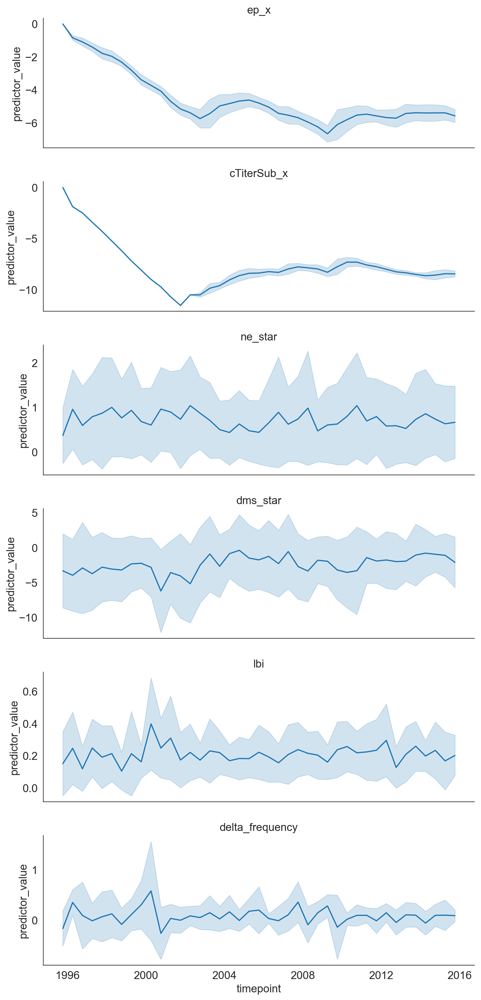

In [35]:
g = sns.FacetGrid(long_predictors_df, row="predictor", aspect=3, sharey=False,
                  row_order=individual_predictor_names_order)
g.map(sns.lineplot, "timepoint", "predictor_value", ci="sd")
g.set_titles("{row_name}")

plt.savefig("../manuscript/figures/predictors_by_timepoint.pdf")

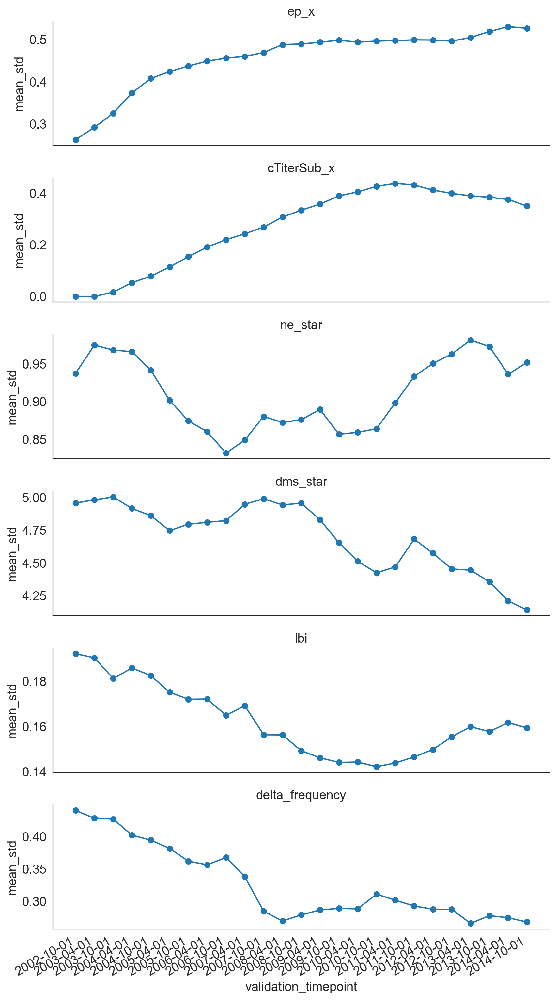

In [36]:
g = sns.FacetGrid(
    mean_stds_by_time_df[mean_stds_by_time_df["predictors"].isin(individual_predictor_names_order)],
    row="predictor",
    row_order=individual_predictor_names_order,
    aspect=3,
    sharey=False
)
g.map(plt.plot, "validation_timepoint", "mean_std", marker="o")
g.set_titles("{row_name}")

plt.gcf().autofmt_xdate()

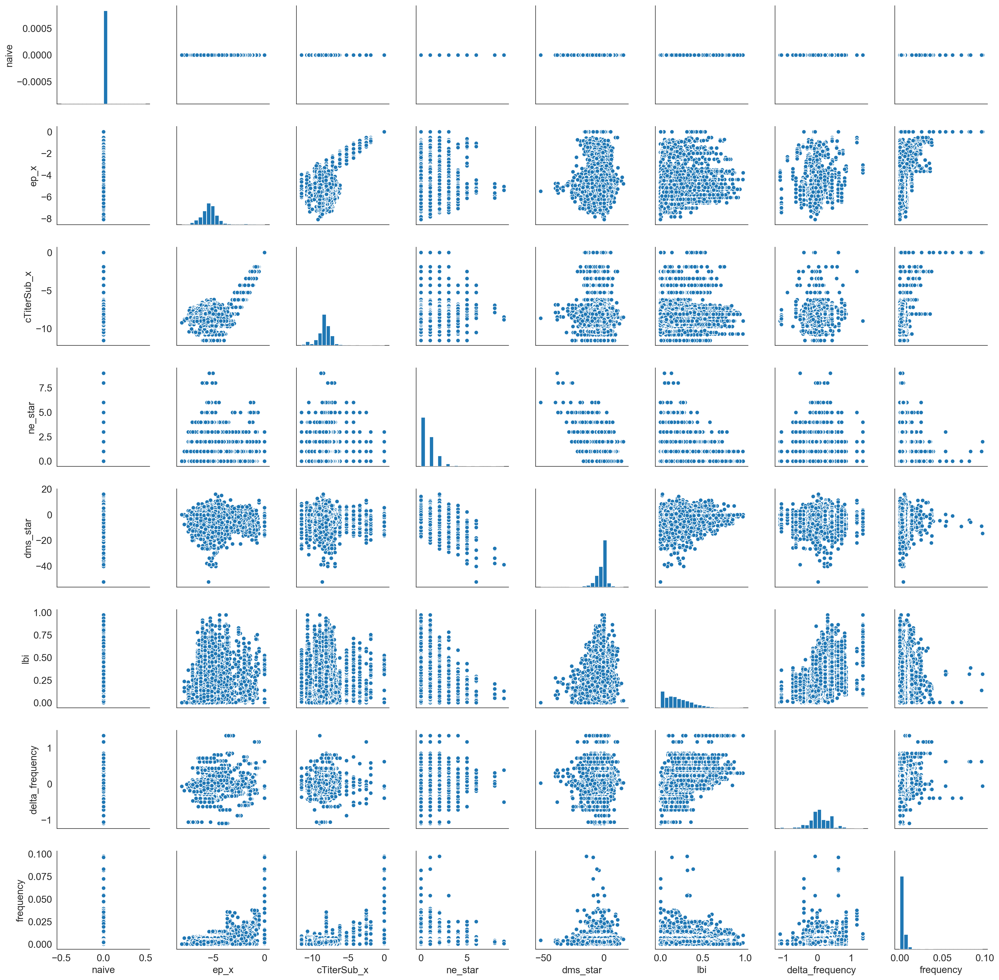

In [38]:
variables_to_plot = [predictor for predictor in predictor_names_order if not "-" in predictor] + ["frequency"]
sns.pairplot(tip_attributes_df.dropna(), vars=variables_to_plot, diag_kind="hist", diag_kws={"bins": 20})

In [39]:
tip_attributes_df.loc[pd.isnull(tip_attributes_df["ep_x"]), ["strain", "timepoint", "frequency"]]

,strain,timepoint,frequency


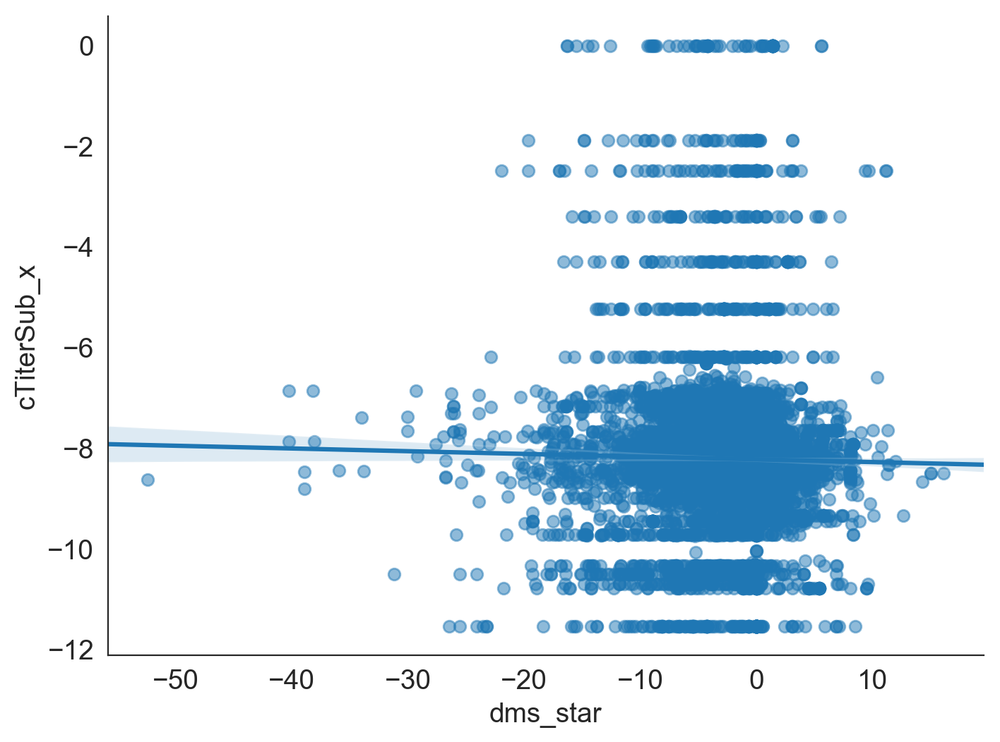

In [40]:
fig, ax = plt.subplots(1, 1, figsize=(8, 6))
sns.regplot("dms_star", "cTiterSub_x", tip_attributes_df, scatter_kws={"alpha": 0.5}, ax=ax)

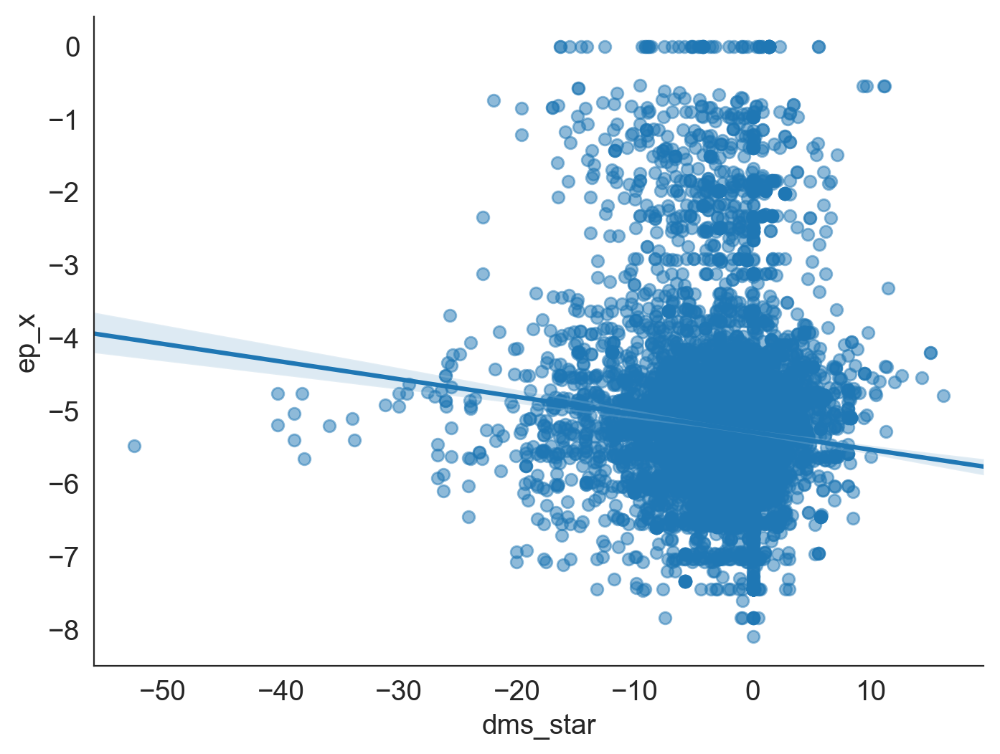

In [41]:
fig, ax = plt.subplots(1, 1, figsize=(8, 6))
sns.regplot("dms_star", "ep_x", tip_attributes_df, scatter_kws={"alpha": 0.5}, ax=ax)

In [42]:
tip_attributes_df.loc[tip_attributes_df["dms_star"] < -15, ["timepoint", "strain", "cTiterSub_x", "ep_x", "dms_star", "frequency", "raw_date"]].head()

,timepoint,strain,cTiterSub_x,ep_x,dms_star,frequency,raw_date
35,1995-10-01,A/NewYork/676/1995,-0.000000,-0.000000,-16.31,0.000780,1995-01-18
51,1995-10-01,A/NewYork/692/1995,-0.000000,-0.000000,-16.31,0.000780,1995-01-18
63,1995-10-01,A/Siena/3/1995,-0.000000,-0.000000,-15.53,0.001687,1995-01-27
94,1996-04-01,A/NewYork/636/1996,-1.878618,-0.844911,-19.63,0.025060,1996-01-22
115,1996-10-01,A/Fujian/202/1996,-2.489628,-0.805533,-16.53,0.037704,1996-07-02


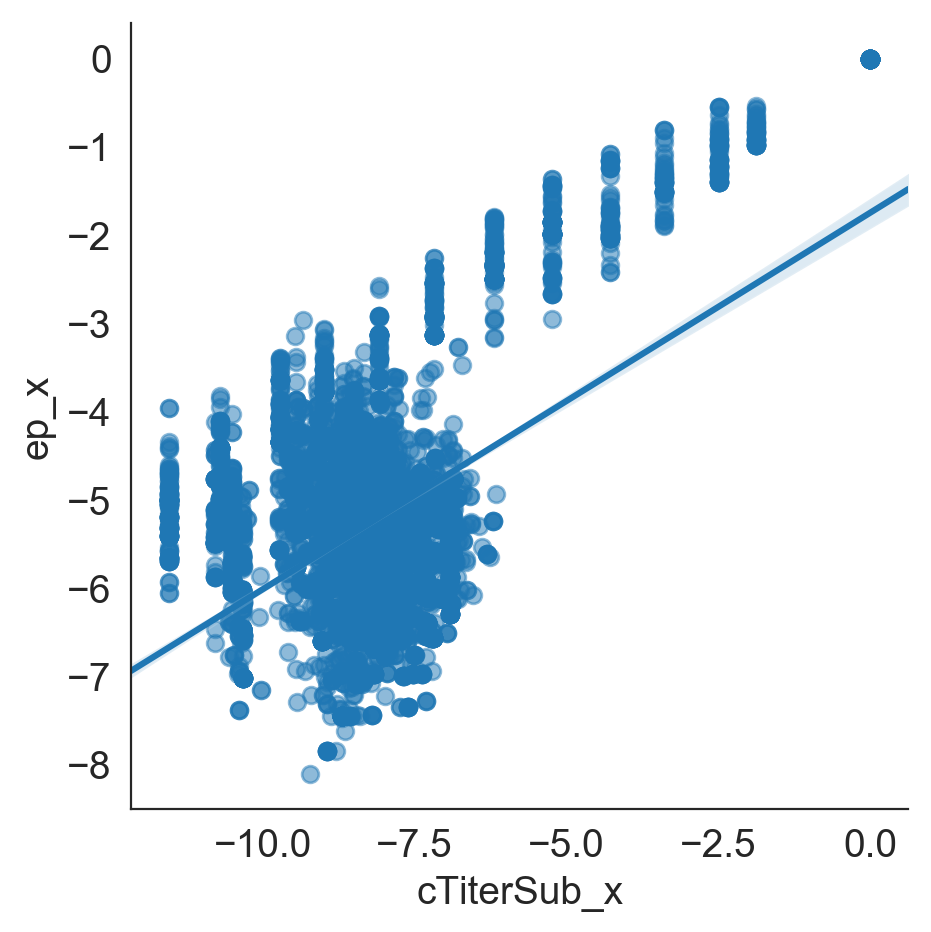

In [43]:
sns.lmplot("cTiterSub_x", "ep_x", tip_attributes_df, scatter_kws={"alpha": 0.5})

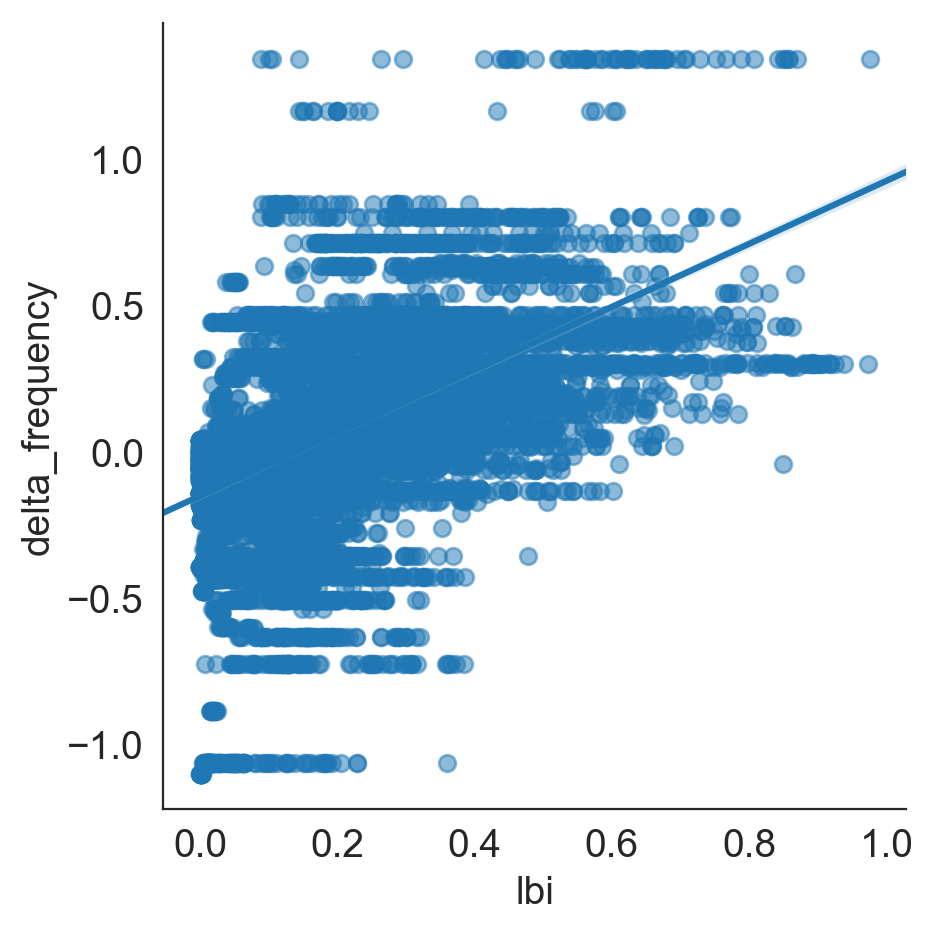

In [44]:
sns.lmplot("lbi", "delta_frequency", tip_attributes_df, scatter_kws={"alpha": 0.5})

## Summarize model residuals
[back to top](#Summarize-models)

In [45]:
residuals_by_timepoint = residual_df.groupby(["predictors", "timepoint"])["residual"].sum().reset_index()

In [46]:
residuals_by_timepoint.head()

,predictors,timepoint,residual
0,cTiterSub,1995-10-01,464.462416
1,cTiterSub,1996-04-01,359.760411
2,cTiterSub,1996-10-01,778.803159
3,cTiterSub,1997-04-01,725.881754
4,cTiterSub,1997-10-01,662.243149


In [47]:
residuals_by_timepoint.groupby("predictors")["residual"].sum()

predictors
cTiterSub                   177999.985497
cTiterSub_x                 175785.786304
delta_frequency             216488.616449
dms_star                    185651.936066
ep                          141451.983702
ep_x                        136452.506877
lbi                         251847.268946
lbi-cTiterSub_x-dms_star    242825.050655
lbi-ep_x-ne_star            237944.231731
naive                       172554.431233
ne_star                     220714.617303
Name: residual, dtype: float64

In [48]:
model_name = "lbi"

In [49]:
model_residuals_by_timepoint = residuals_by_timepoint[residuals_by_timepoint["predictors"] == model_name]

In [50]:
max_lags = 18

Text(0,0.5,'Number of clades')

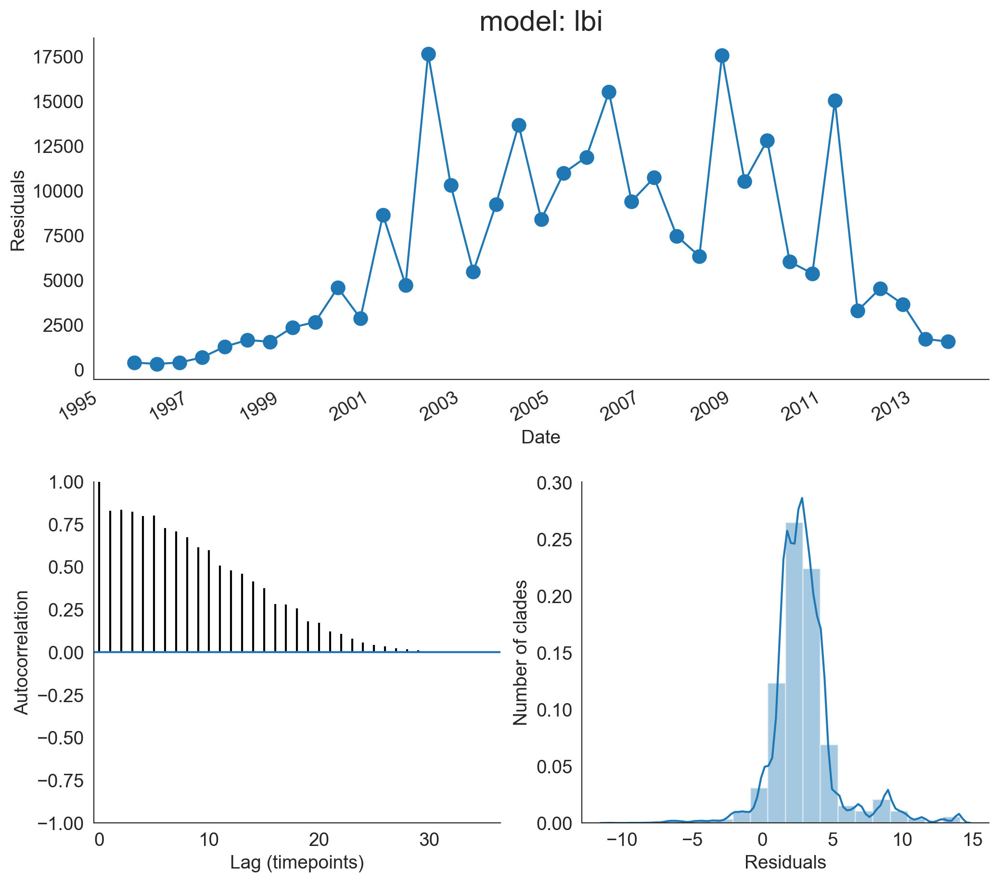

In [51]:
fig = plt.figure(figsize=(12, 12))
gs = gridspec.GridSpec(2, 2)
gs.update(hspace=0.3)

ax1 = plt.subplot(gs[0, :])
ax1.plot(model_residuals_by_timepoint["timepoint"], model_residuals_by_timepoint["residual"], "o-", markersize=10)
ax1.set_xlabel("Date")
ax1.set_ylabel("Residuals")
ax1.set_title("model: %s" % model_name)
plt.gcf().autofmt_xdate()

ax2 = plt.subplot(gs[1, :-1])
max_lags = len(model_residuals_by_timepoint["residual"]) - 1
lags, autocorrelation, lines, horizonal_lines = ax2.acorr(
    model_residuals_by_timepoint["residual"],
    maxlags=max_lags
)
ax2.set_xlabel("Lag (timepoints)")
ax2.set_ylabel("Autocorrelation")
ax2.set_xlim(-0.5, max_lags + 0.5)
ax2.set_ylim(-1, 1)

ax3 = plt.subplot(gs[1:, -1])
sns.distplot(residual_df.loc[residual_df["predictors"] == model_name, "residual"], ax=ax3, bins=20)
ax3.set_xlabel("Residuals")
ax3.set_ylabel("Number of clades")

### Residuals by predictor

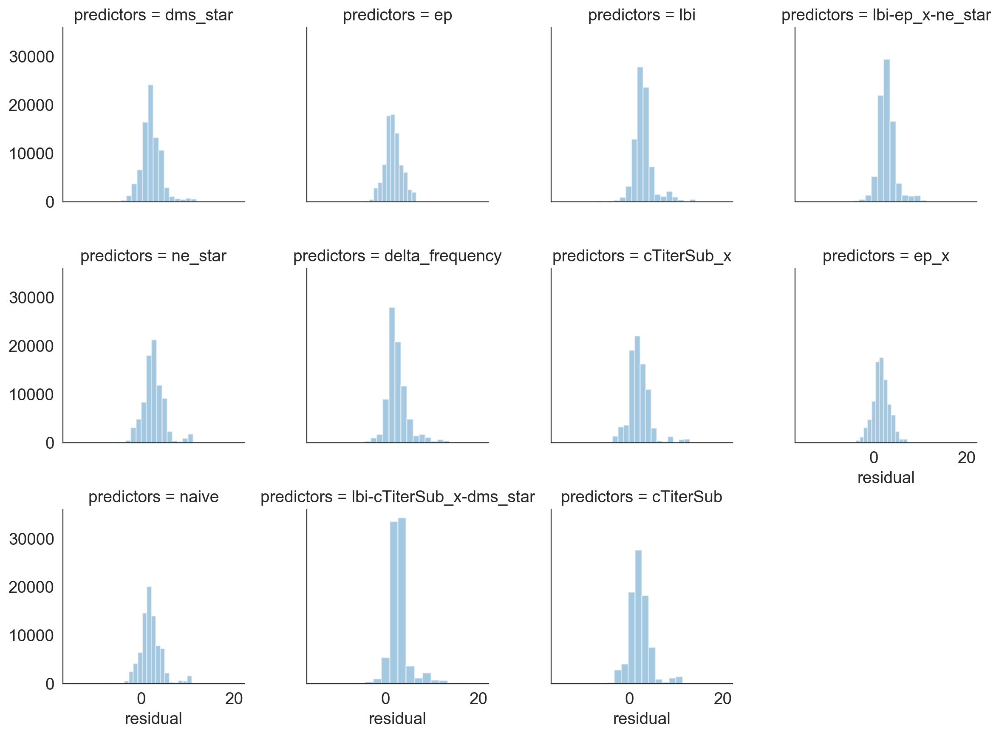

In [52]:
g = sns.FacetGrid(residual_df, col="predictors", col_wrap=4)
g.map(sns.distplot, "residual", bins=20, kde=False)

In [53]:
residual_df.groupby("predictors")["residual"].median().sort_values()

predictors
ep_x                        1.575127
ep                          1.581871
naive                       1.804943
cTiterSub_x                 1.822466
dms_star                    1.871674
cTiterSub                   1.891473
delta_frequency             2.110667
ne_star                     2.479291
lbi-ep_x-ne_star            2.595165
lbi-cTiterSub_x-dms_star    2.697715
lbi                         2.742449
Name: residual, dtype: float64

In [54]:
residual_df.groupby("predictors")["residual"].count()

predictors
cTiterSub                   84586
cTiterSub_x                 84586
delta_frequency             84586
dms_star                    84586
ep                          84586
ep_x                        84586
lbi                         84586
lbi-cTiterSub_x-dms_star    84586
lbi-ep_x-ne_star            84586
naive                       84586
ne_star                     84586
Name: residual, dtype: int64

In [55]:
(residual_df["residual"] < -0.01).sum()

91726

### Residuals by timepoint

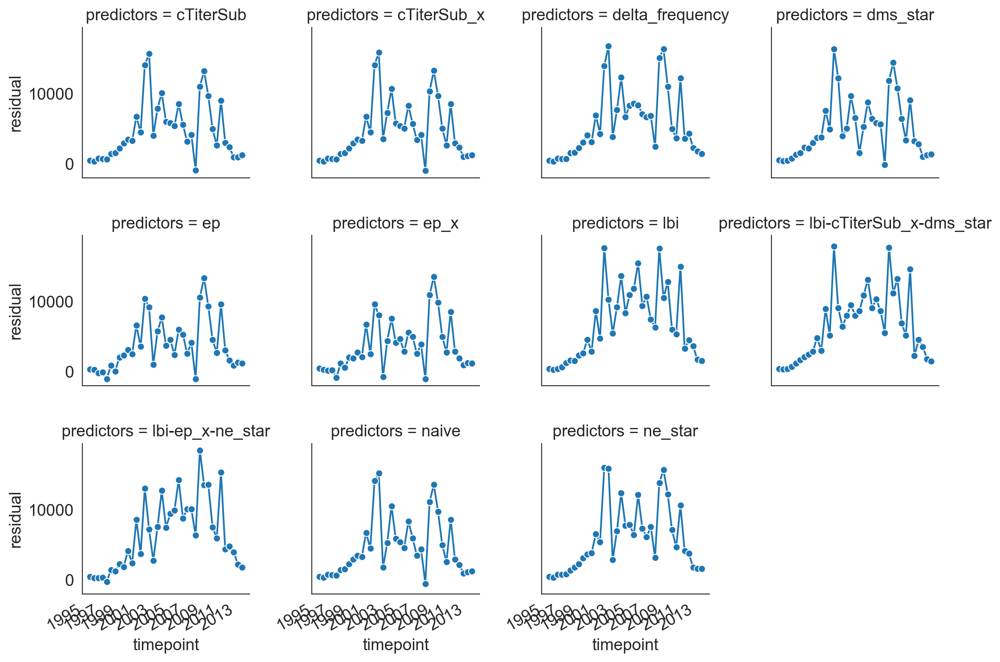

In [56]:
g = sns.FacetGrid(residuals_by_timepoint, col="predictors", col_wrap=4)
g.map(sns.lineplot, "timepoint", "residual", marker="o", linestyle="")
plt.gcf().autofmt_xdate()

In [57]:
np.abs(residuals_by_timepoint[residuals_by_timepoint["predictors"] == "lbi"]["residual"].values - residuals_by_timepoint[residuals_by_timepoint["predictors"] == "naive"]["residual"].values)

array([  59.26188662,   24.24742413,  369.81985389,   25.96092466,
        633.17950756,  240.81369098,   36.35559189,  135.57581032,
        269.11865557, 1141.96344867,  388.42179607, 1908.06281629,
        246.27878106, 3556.1193199 , 4877.80386764, 3723.04500484,
       3966.0868912 , 3157.05555121, 2495.58291609, 5590.47771901,
       7338.25948865, 7176.78187401, 3455.70552229, 7267.0282931 ,
       3124.68708782, 6888.37026597, 6454.21702884, 3053.18189221,
       3085.20200809, 1059.33699884, 2802.17803003, 6426.39454991,
        388.57538689, 2409.11960022, 2720.69560243,  625.73888289,
        307.76634512])

### Autocorrelation of residuals

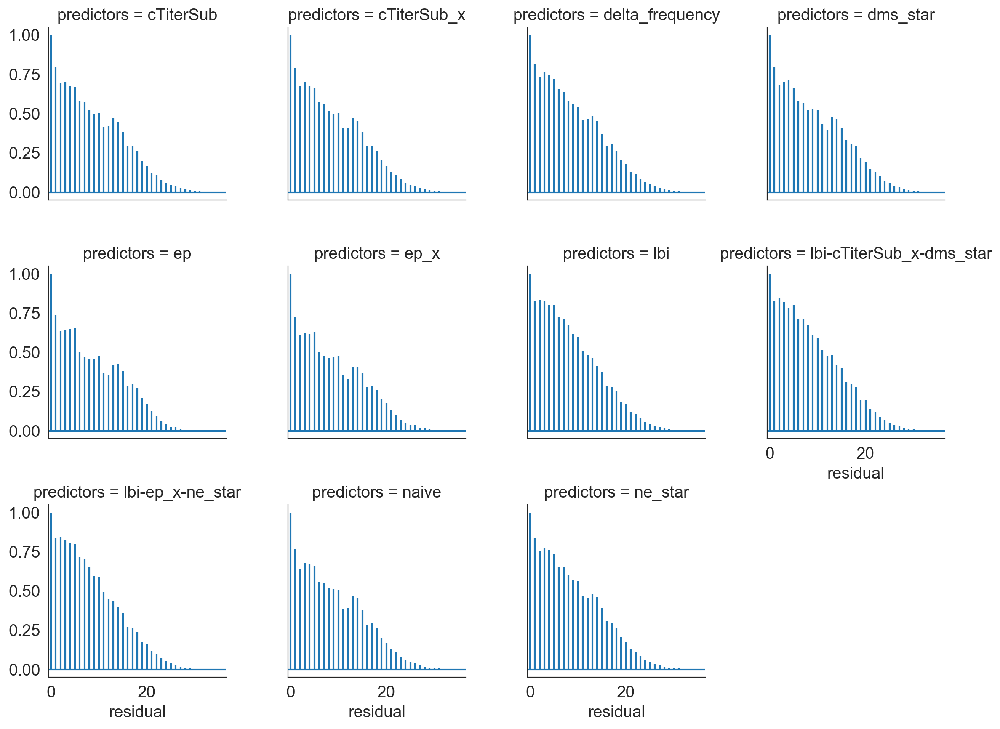

In [58]:
g = sns.FacetGrid(residuals_by_timepoint, col="predictors", col_wrap=4)
g.map(plt.acorr, "residual", maxlags=max_lags)

for ax in g.axes.flatten():
    ax.set_xlim(-0.5, max_lags + 0.5)

## Summarize observed and predicted distances
[back to top](#Summarize-models)

$$
d_{i}(x(t)) = \sum_{j}x_{j}d_{ij}
$$

$$
u = t + \Delta{t}
$$

$$
\hat{x}_{i}(t, u) = x_{i}(t)e^{(f_{i}(t)(u - t))}
$$

$$
y = x_{i}(t)d_{i}(x(u))
$$

$$
\hat{y} = x_{i}(t)d_{i}(\hat{x}(t, u))
$$

$$
D(x(t), x(u)) = \sum_{i}x_{i}d_{i}(u)
$$

$$
D(\hat{x}(t, u), x(u)) = \sum_{i}x_{i}e^{(f_{i}(t)(u - t))}d_{i}(u)
$$

$$
L = \sum_{t}D(\hat{x}(t, u), x(u))
$$

In [59]:
frequency_df[frequency_df["predictors"] == "lbi"].head()

,frequency,projected_frequency,strain,timepoint,weighted_distance_to_future_hat,weighted_distance_to_present,y_hat,weighted_distance_to_future,y,residual,validation_timepoint,predictors
18736,0.000472,0.000378,A/Akita/69/2002,2002-10-01,17.955038,7.631586,8.219782,17.955038,17.955038,9.735256,2002-10-01,lbi
18737,0.007731,0.004290,A/Argentina/1/2002,2002-10-01,19.618858,13.347181,13.770790,19.618858,19.618858,5.848068,2002-10-01,lbi
18738,0.008376,0.008425,A/Auckland/26/2002,2002-10-01,19.003367,8.300603,8.885482,19.003367,19.003367,10.117885,2002-10-01,lbi
18739,0.006899,0.008026,A/Auckland/57/2002,2002-10-01,18.986559,8.790398,9.316806,18.986559,18.986559,9.669753,2002-10-01,lbi
18740,0.008295,0.014063,A/Auckland/608/2002,2002-10-01,18.999563,8.806410,9.320451,18.999563,18.999563,9.679112,2002-10-01,lbi


In [60]:
frequency_df["observed_rank"] = frequency_df["y"] # / frequency_df["frequency"]
frequency_df["estimated_rank"] = frequency_df["y_hat"] # / frequency_df["frequency"]

In [61]:
data_to_plot = frequency_df[frequency_df["predictors"] == "lbi"]

In [62]:
minimum_observed_distance = data_to_plot.groupby("validation_timepoint")["observed_rank"].min().reset_index()

In [63]:
minimum_estimated_distance = data_to_plot.groupby("validation_timepoint")["estimated_rank"].min().reset_index()

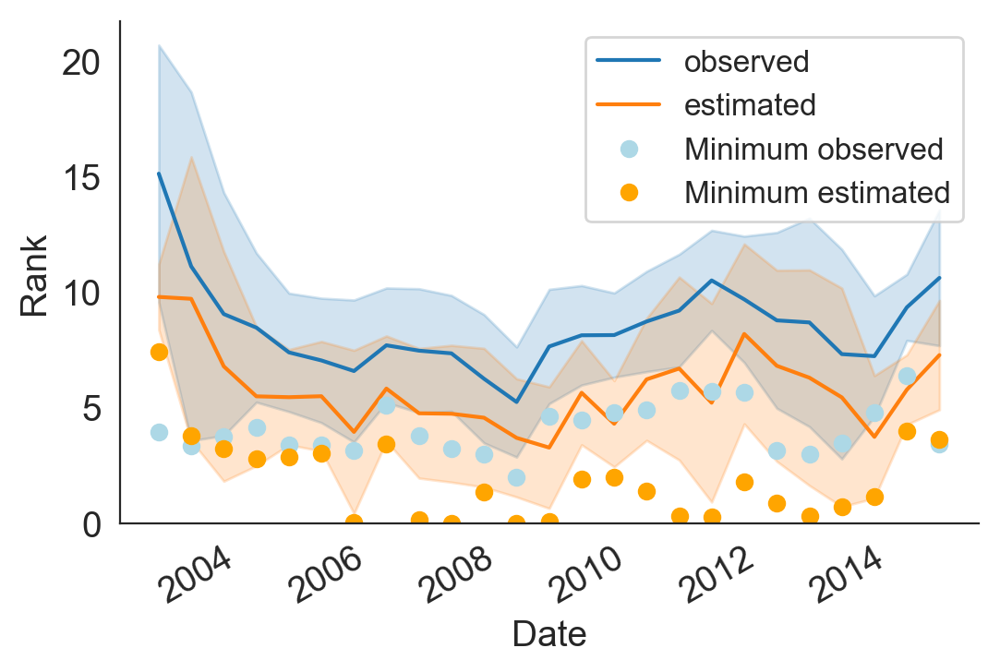

In [64]:
fig, ax = plt.subplots(1, 1, figsize=(6, 4))

ax = sns.lineplot(
    "validation_timepoint",
    "observed_rank",
    data=data_to_plot,
    ci="sd",
    label="observed",
    ax=ax
)

ax = sns.lineplot(
    "validation_timepoint",
    "estimated_rank",
    data=data_to_plot,
    ci="sd",
    label="estimated",
    ax=ax
)

ax.plot(
    minimum_observed_distance["validation_timepoint"],
    minimum_observed_distance["observed_rank"],
    "o",
    color="lightblue",
    label="Minimum observed"
)

ax.plot(
    minimum_estimated_distance["validation_timepoint"],
    minimum_estimated_distance["estimated_rank"],
    "o",
    color="orange",
    label="Minimum estimated"
)

ax.legend()
ax.set_xlabel("Date")
ax.set_ylabel("Rank")
ax.set_ylim(bottom=0)
plt.gcf().autofmt_xdate()

In [65]:
vaccine_strains = [
    "A/Wisconsin/67/2005",
    "A/Brisbane/10/2007",
    "A/Perth/16/2009",
    "A/Victoria/361/2011",
    "A/Texas/50/2012",
    "A/Switzerland/9715293/2013",
    "A/HongKong/4801/2014"
]

In [66]:
vaccine_strain_data_to_plot = data_to_plot.loc[data_to_plot["strain"].isin(vaccine_strains),
                                               ["strain", "validation_timepoint", "observed_rank", "estimated_rank"]]

In [67]:
vaccine_strain_data_to_plot

,strain,validation_timepoint,observed_rank,estimated_rank
23157,A/Perth/16/2009,2009-10-01,7.744556,3.153146
25444,A/Victoria/361/2011,2012-04-01,6.312691,3.349439
25917,A/Texas/50/2012,2012-10-01,5.429812,3.276378
27086,A/HongKong/4801/2014,2014-04-01,6.399398,9.223726
27395,A/Switzerland/9715293/2013,2014-04-01,8.287754,6.130572
27662,A/HongKong/4801/2014,2014-10-01,3.423462,7.614976


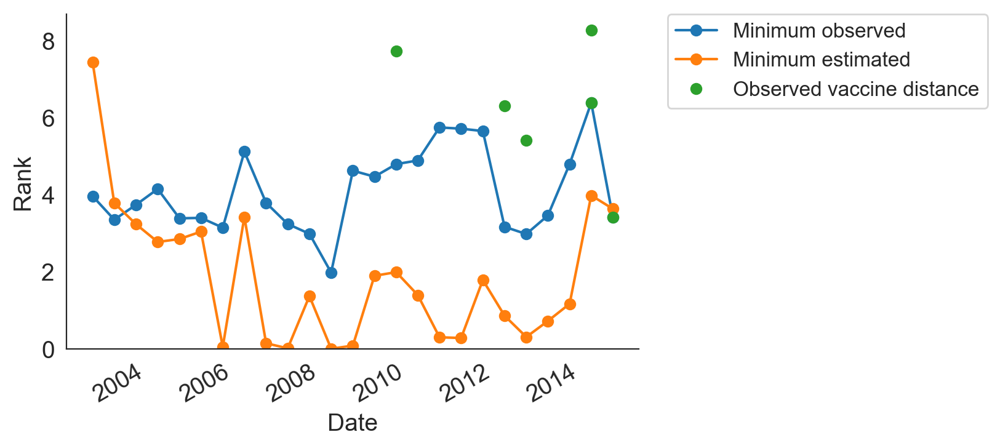

In [68]:
fig, ax = plt.subplots(1, 1, figsize=(6, 4))

ax.plot(
    minimum_observed_distance["validation_timepoint"],
    minimum_observed_distance["observed_rank"],
    "o-",
    label="Minimum observed"
)

ax.plot(
    minimum_estimated_distance["validation_timepoint"],
    minimum_estimated_distance["estimated_rank"],
    "o-",
    label="Minimum estimated"
)

ax.plot(
    vaccine_strain_data_to_plot["validation_timepoint"],
    vaccine_strain_data_to_plot["observed_rank"],
    "o",
    label="Observed vaccine distance"
)

ax.set_xlabel("Date")
ax.set_ylabel("Rank")
ax.set_ylim(bottom=0)
ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)
plt.gcf().autofmt_xdate()

In [69]:
regressions = []
for predictors, group_df in frequency_df.groupby(["predictors"]):
    slope, intercept, r_value, p_value, std_err = linregress(
        group_df["y"],
        group_df["y_hat"]
    )
    
    regressions.append({
        "predictors": predictors,
        "slope": slope,
        "intercept": intercept,
        "r_value": r_value,
        "r_2": r_value ** 2,
        "p_value": p_value
    })

regressions = pd.DataFrame(regressions).sort_values(by="r_2", ascending=False)

In [70]:
regressions

,intercept,p_value,predictors,r_2,r_value,slope
8,-1.381245,0.0,lbi-ep_x-ne_star,0.683361,0.826657,0.908206
6,-1.305945,0.0,lbi,0.683164,0.826537,0.828938
4,1.593622,0.0,ep,0.611173,0.781775,0.610623
9,1.484381,0.0,naive,0.589866,0.768027,0.588619
0,1.598375,0.0,cTiterSub,0.585535,0.765203,0.588514
10,0.771825,0.0,ne_star,0.581765,0.762735,0.608325
5,1.509967,0.0,ep_x,0.572986,0.756958,0.669209
2,0.115549,0.0,delta_frequency,0.558915,0.747606,0.695430
3,1.441595,0.0,dms_star,0.557255,0.746495,0.593448
1,2.355239,0.0,cTiterSub_x,0.336856,0.580393,0.530468


In [71]:
regressions_order = regressions["predictors"].values

In [72]:
regressions_order

array(['lbi-ep_x-ne_star', 'lbi', 'ep', 'naive', 'cTiterSub', 'ne_star',
       'ep_x', 'delta_frequency', 'dms_star', 'cTiterSub_x',
       'lbi-cTiterSub_x-dms_star'], dtype=object)

In [73]:
final_frequency_df = frequency_df[frequency_df["predictors"].isin(best_models)].copy()

In [74]:
final_frequency_df["predictors_name"] = final_frequency_df["predictors"].map(dict(zip(best_models, best_predictor_names)))

In [75]:
final_frequency_df.head()

,frequency,projected_frequency,strain,timepoint,weighted_distance_to_future_hat,weighted_distance_to_present,y_hat,weighted_distance_to_future,y,residual,validation_timepoint,predictors,observed_rank,estimated_rank,predictors_name
0,0.000472,0.000512,A/Akita/69/2002,2002-10-01,17.955038,7.631586,8.772507,17.955038,17.955038,9.182531,2002-10-01,dms_star,17.955038,8.772507,DMS phenotypes
1,0.007731,0.006481,A/Argentina/1/2002,2002-10-01,19.618858,13.347181,13.726742,19.618858,19.618858,5.892116,2002-10-01,dms_star,19.618858,13.726742,DMS phenotypes
2,0.008376,0.007815,A/Auckland/26/2002,2002-10-01,19.003367,8.300603,9.450009,19.003367,19.003367,9.553358,2002-10-01,dms_star,19.003367,9.450009,DMS phenotypes
3,0.006899,0.003633,A/Auckland/57/2002,2002-10-01,18.986559,8.790398,9.917546,18.986559,18.986559,9.069013,2002-10-01,dms_star,18.986559,9.917546,DMS phenotypes
4,0.008295,0.003956,A/Auckland/608/2002,2002-10-01,18.999563,8.806410,9.925520,18.999563,18.999563,9.074043,2002-10-01,dms_star,18.999563,9.925520,DMS phenotypes


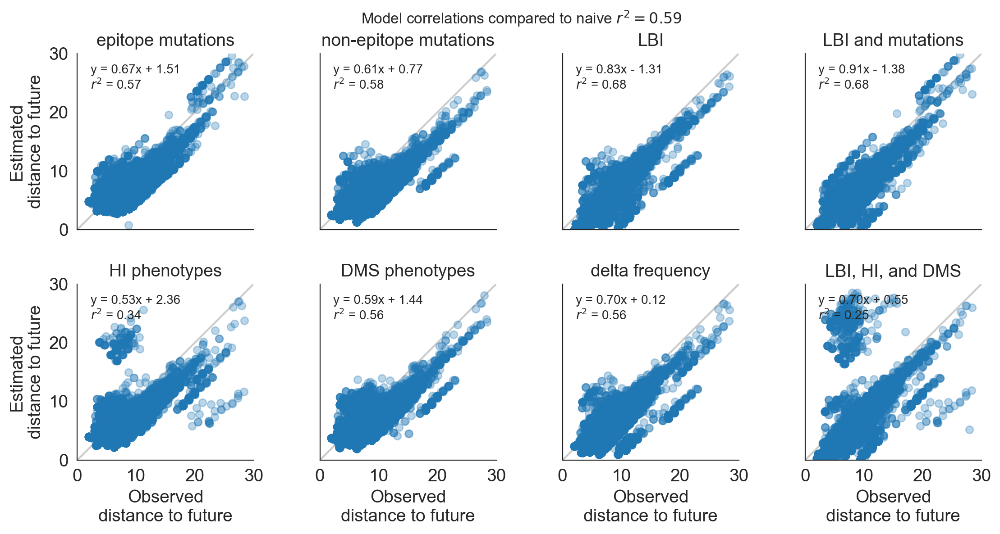

In [76]:
max_y = 30
x = y = np.linspace(0, max_y, 10)

g = sns.FacetGrid(final_frequency_df, col="predictors_name", col_wrap=4, col_order=best_predictor_names)
g.map(plt.plot, "y", "y_hat", marker="o", linestyle="", alpha=0.3)
g.set_titles("{col_name}")
g.set_axis_labels("Observed\ndistance to future", "Estimated\ndistance to future")

for ((i, j, k), facet_df), ax in zip(g.facet_data(), g.axes.flat):
    ax.plot(x, y, color="#cccccc", zorder=-10)
    
    slope, intercept, r_value, p_value = regressions.loc[
        regressions["predictors"] == facet_df["predictors"].unique()[0],
        ["slope", "intercept", "r_value", "p_value"]
    ].values[0]
    
    if p_value > 0.001:
        p_value = "\nP value = %.3f" % p_value
    else:
        p_value = ""
    
    if intercept < 0:
        intercept_operator = "-"
        intercept = -intercept
    else:
        intercept_operator = "+"
    
    ax.text(
        0.075,
        0.8,
        "y = %.2fx %s %.2f\n$r^2$ = %.2f%s" % (slope, intercept_operator, intercept, r_value ** 2, p_value),
        transform=ax.transAxes,
        fontsize=10
    )
    ax.set_aspect("equal")
    ax.set_xlim(0, max_y)
    ax.set_ylim(0, max_y)
    
plt.suptitle(
    "Model correlations compared to naive $r^2 = %.2f$" % regressions.loc[regressions["predictors"] == "naive", "r_2"].values[0],
    fontsize=12,
    y=1.0
)
plt.subplots_adjust(hspace=0.75, top=0.75, wspace=0.05)
plt.tight_layout()

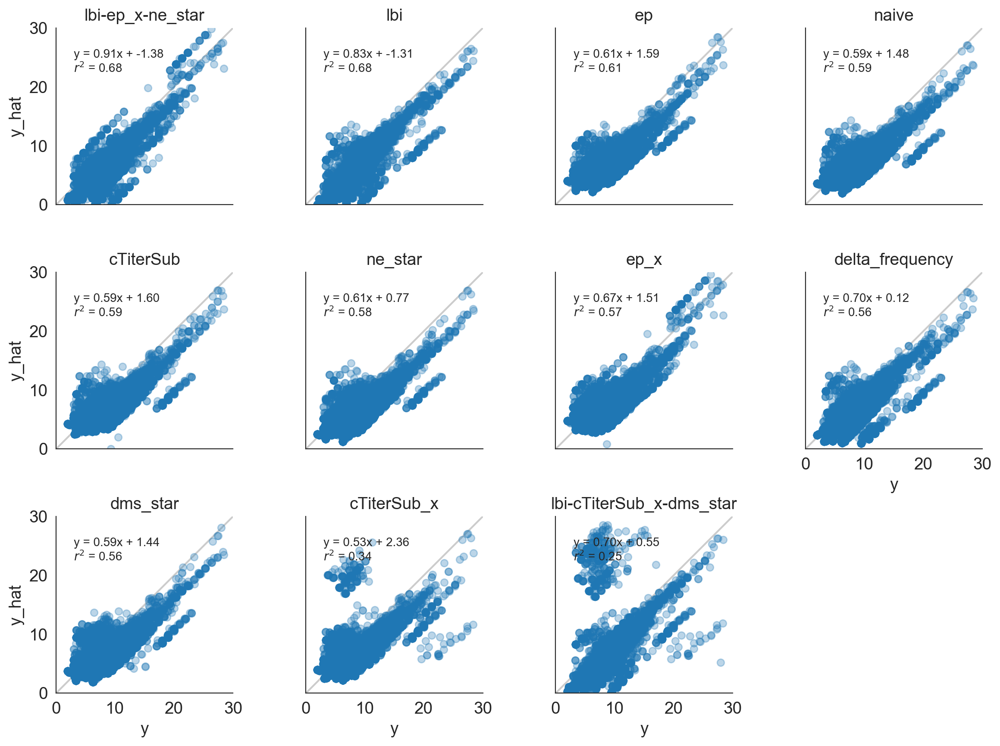

In [77]:
max_y = 30
x = y = np.linspace(0, max_y, 10)

g = sns.FacetGrid(frequency_df, col="predictors", col_wrap=4, col_order=regressions_order)
g.map(plt.plot, "y", "y_hat", marker="o", linestyle="", alpha=0.3)
g.set_titles("{col_name}")

for ((i, j, k), facet_df), ax in zip(g.facet_data(), g.axes.flat):
    slope, intercept, r_value, p_value = regressions.loc[
        regressions["predictors"] == facet_df["predictors"].unique()[0],
        ["slope", "intercept", "r_value", "p_value"]
    ].values[0]
    
    if p_value > 0.001:
        p_value = "\nP value = %.3f" % p_value
    else:
        p_value = ""
    
    ax.plot(x, y, color="#cccccc", zorder=-10)
    
    ax.text(
        0.1,
        0.75,
        "y = %.2fx + %.2f\n$r^2$ = %.2f%s" % (slope, intercept, r_value ** 2, p_value),
        transform=ax.transAxes,
        fontsize=10
    )
    ax.set_aspect("equal")
    ax.set_xlim(0, max_y)
    ax.set_ylim(0, max_y)

Text(0.35,0.75,'mean = 8.50')

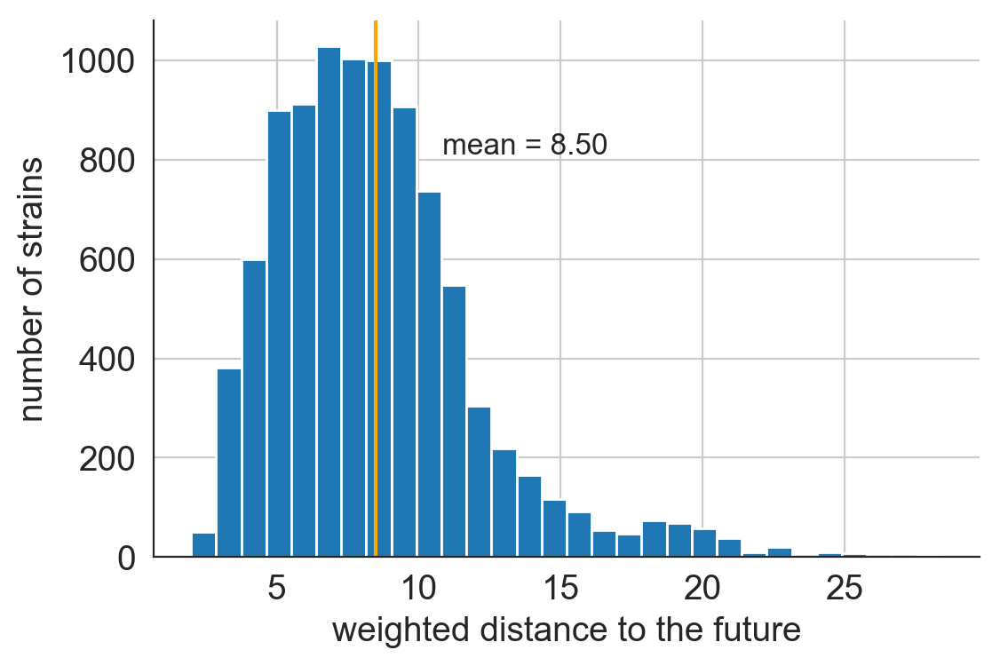

In [78]:
ax = frequency_df[frequency_df["predictors"] == "naive"]["y"].hist(bins=30)
ax.set_xlabel("weighted distance to the future")
ax.set_ylabel("number of strains")

mean_y = frequency_df[frequency_df["predictors"] == "naive"]["y"].mean()
ax.axvline(
    x=mean_y,
    color="orange"
)

ax.text(
    0.35,
    0.75,
    "mean = %.2f" % (mean_y,),
    transform=ax.transAxes,
    fontsize=12
)


Text(0.35,0.75,'mean = 6.52')

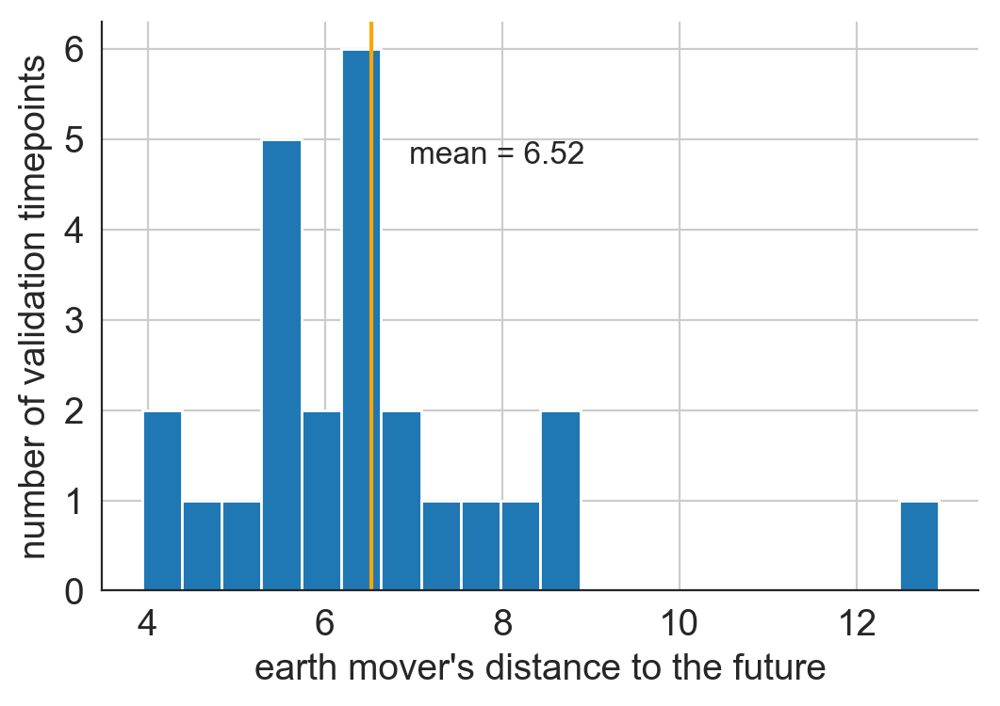

In [79]:
ax = errors_by_time_df[errors_by_time_df["predictors"] == "naive"]["validation_error"].hist(bins=20)
ax.set_xlabel("earth mover's distance to the future")
ax.set_ylabel("number of validation timepoints")

mean_y = errors_by_time_df[errors_by_time_df["predictors"] == "naive"]["validation_error"].mean()
ax.axvline(
    x=mean_y,
    color="orange"
)

ax.text(
    0.35,
    0.75,
    "mean = %.2f" % (mean_y,),
    transform=ax.transAxes,
    fontsize=12
)


In [80]:
best_models = [
    "naive",
    "lbi-dms_star-cTiterSub_x",
    "lbi-delta_frequency",
    "lbi",
    "lbi-ep_x-ne_star"
]

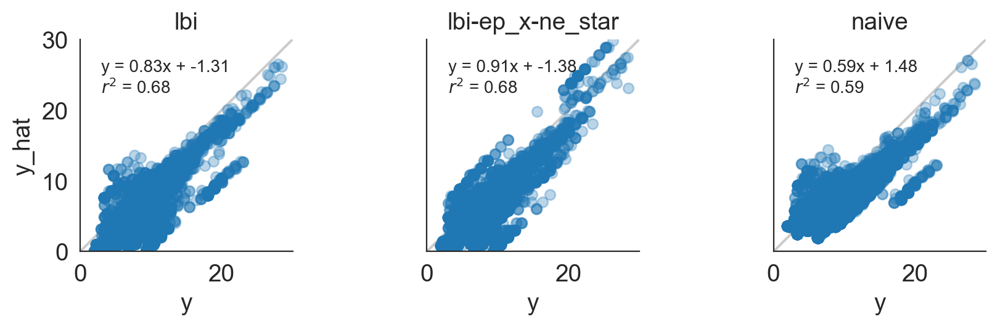

In [81]:
max_y = 30
x = y = np.linspace(0, max_y, 10)

g = sns.FacetGrid(frequency_df[frequency_df["predictors"].isin(best_models)], col="predictors", col_wrap=4)
g.map(plt.plot, "y", "y_hat", marker="o", linestyle="", alpha=0.3)
g.set_titles("{col_name}")

for ((i, j, k), facet_df), ax in zip(g.facet_data(), g.axes.flat):
    slope, intercept, r_value, p_value, std_err = linregress(
        facet_df["y"],
        facet_df["y_hat"]
    )
    
    if p_value > 0.001:
        p_value = "\nP value = %.3f" % p_value
    else:
        p_value = ""
    
    ax.plot(x, y, color="#cccccc", zorder=-10)
    
    ax.text(
        0.1,
        0.75,
        "y = %.2fx + %.2f\n$r^2$ = %.2f%s" % (slope, intercept, r_value ** 2, p_value),
        transform=ax.transAxes,
        fontsize=10
    )
    ax.set_aspect("equal")
    ax.set_xlim(0, max_y)
    ax.set_ylim(0, max_y)

In [82]:
frequency_df["year_month"] = frequency_df["validation_timepoint"].dt.strftime("%Y-%m")
frequency_df["year"] = frequency_df["validation_timepoint"].dt.strftime("%Y")

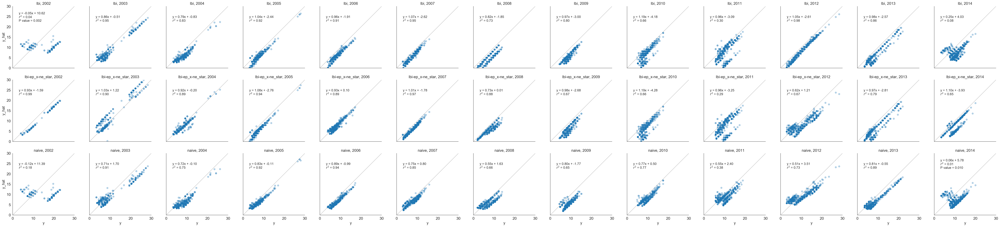

In [83]:
max_y = 30
x = y = np.linspace(0, max_y, 10)

g = sns.FacetGrid(frequency_df[frequency_df["predictors"].isin(best_models)], row="predictors", col="year", height=4)
g.map(plt.plot, "y", "y_hat", marker="o", linestyle="", alpha=0.3)
g.set_titles("{row_name}, {col_name}")

regressions_by_time = []
for ((i, j, k), facet_df), ax in zip(g.facet_data(), g.axes.flat):
    slope, intercept, r_value, p_value, std_err = linregress(
        facet_df["y"],
        facet_df["y_hat"]
    )
    
    regressions_by_time.append({
        "predictors": facet_df["predictors"].unique()[0],
        "timepoint": facet_df["timepoint"].unique()[0],
        "slope": slope,
        "intercept": intercept,
        "r_value": r_value,
        "p_value": p_value
    })
    
    if p_value > 0.001:
        p_value = "\nP value = %.3f" % p_value
    else:
        p_value = ""
    
    ax.plot(x, y, color="#cccccc", zorder=-10)
    
    ax.text(
        0.1,
        0.75,
        "y = %.2fx + %.2f\n$r^2$ = %.2f%s" % (slope, intercept, r_value ** 2, p_value),
        transform=ax.transAxes,
        fontsize=12
    )
    ax.set_aspect("equal")
    ax.set_xlim(0, max_y)
    ax.set_ylim(0, max_y)
    
plt.tight_layout()

In [ ]:
frequency_df.head()

In [ ]:
regressions_by_time = []
for (predictors, timepoint), group_df in frequency_df.groupby(["predictors", "timepoint"]):
    slope, intercept, r_value, p_value, std_err = linregress(
        group_df["y"],
        group_df["y_hat"]
    )
    
    regressions_by_time.append({
        "predictors": predictors,
        "timepoint": timepoint,
        "slope": slope,
        "intercept": intercept,
        "r_value": r_value,
        "p_value": p_value
    })

regressions_by_time = pd.DataFrame(regressions_by_time)

In [ ]:
regressions_by_time.head()

In [ ]:
naive_regressions_by_time = regressions_by_time[regressions_by_time["predictors"] == "naive"]
non_naive_regressions_by_time = regressions_by_time[regressions_by_time["predictors"] != "naive"]

In [ ]:
g = sns.FacetGrid(non_naive_regressions_by_time, row="predictors", aspect=6)
g.map(
    plt.plot,
    "timepoint",
    "r_value",
    marker="o"
)

for ax in g.axes.flatten():
    ax.plot(
        naive_regressions_by_time["timepoint"],
        naive_regressions_by_time["r_value"],
        marker="o",
        color="#cccccc",
        zorder=-10
    )

In [ ]:
g = sns.FacetGrid(non_naive_regressions_by_time, row="predictors", aspect=6)
g.map(
    plt.plot,
    "timepoint",
    "slope",
    marker="o"
)

for ax in g.axes.flatten():
    ax.plot(
        naive_regressions_by_time["timepoint"],
        naive_regressions_by_time["slope"],
        marker="o",
        color="#cccccc",
        zorder=-10
    )

In [ ]:
"""
max_y = 25
x = y = np.linspace(0, max_y, 10)

g = sns.FacetGrid(frequency_df, row="predictors", col="year_month", height=4)
g.map(plt.plot, "y", "y_hat", marker="o", linestyle="", alpha=0.3)
g.set_titles("{row_name}, {col_name}")

regressions_by_time = []
for ((i, j, k), facet_df), ax in zip(g.facet_data(), g.axes.flat):
    slope, intercept, r_value, p_value, std_err = linregress(
        facet_df["y"],
        facet_df["y_hat"]
    )
    
    regressions_by_time.append({
        "predictors": facet_df["predictors"].unique()[0],
        "timepoint": facet_df["timepoint"].unique()[0],
        "slope": slope,
        "intercept": intercept,
        "r_value": r_value,
        "p_value": p_value
    })
    
    if p_value > 0.001:
        p_value = "\nP value = %.3f" % p_value
    else:
        p_value = ""
    
    ax.plot(x, y, color="#cccccc", zorder=-10)
    
    ax.text(
        0.1,
        0.75,
        "y = %.2fx + %.2f\n$r^2$ = %.2f%s" % (slope, intercept, r_value ** 2, p_value),
        transform=ax.transAxes,
        fontsize=12
    )
    ax.set_aspect("equal")
    ax.set_xlim(0, max_y)
    ax.set_ylim(0, max_y)
    
plt.tight_layout()"""

## Summarize model forecasting error
[back to top](#Summarize-models)

### Earth mover's distances

Training and validation errors are reported as [earth mover's distances](https://en.wikipedia.org/wiki/Earth_mover%27s_distance). These values minimize the distance between observed and projected frequencies of tips at each timepoint with Hamming distance between amino acid sequences providing the ground distance between each pair of tips in respective timepoints.

In [ ]:
errors_by_time_df.head()

In [ ]:
distance_df = errors_by_time_df.groupby("predictors")["validation_error"].aggregate([
    "sum",
    "mean",
    "median"
]).sort_values(by="sum").reset_index()

In [ ]:
distance_df

In [ ]:
distance_df.loc[distance_df["predictors"] == "naive", "sum"].values[0]

In [ ]:
fig, ax = plt.subplots(1, 1, figsize=(8, 6))
sns.pointplot(
    x="sum",
    y="predictors",
    data=distance_df,
    join=False,
    ax=ax
)

ax.set_xlabel("Total earth mover's distance")
ax.set_ylabel("Model")
ax.axvline(
    x=distance_df.loc[distance_df["predictors"] == "naive", "sum"].values[0],
    color="#cccccc",
    zorder=-10
)

In [ ]:
fig, ax = plt.subplots(1, 1, figsize=(8, 6))
sns.pointplot(
    x="mean",
    y="predictors",
    data=distance_df,
    join=False,
    ax=ax
)

ax.set_xlabel("Mean earth mover's distance")
ax.set_ylabel("Model")

ax.axvline(
    x=distance_df.loc[distance_df["predictors"] == "naive", "mean"].values[0],
    color="#cccccc",
    zorder=-10
)

In [ ]:
fig, ax = plt.subplots(1, 1, figsize=(8, 6))
sns.pointplot(
    x="median",
    y="predictors",
    data=distance_df,
    join=False,
    ax=ax,
    order=distance_df.sort_values("median").loc[:, "predictors"]
)

ax.set_xlabel("Median earth mover's distance")
ax.set_ylabel("Model")

ax.axvline(
    x=distance_df.loc[distance_df["predictors"] == "naive", "median"].values[0],
    color="#cccccc",
    zorder=-10
)

In [ ]:
errors_by_time_df.head()

In [ ]:
predictor_type_order = [
    "naive",
    "ep",
    "cTiterSub",
    "ep_x",
    "cTiterSub_x",
    "ne_star",
    "dms_star",
    "lbi",
    "delta_frequency"
]

In [ ]:
predictor_names = [
    "null",
    "epitope mutations",
    "HI phenotypes",
    "epitope cross-immunity",
    "HI cross-immunity",
    "non-epitope mutations",
    "DMS mutation effects",
    "LBI",
    "delta frequency"
]

In [ ]:
"""
predictor_type_order = [
    "naive",
    "lbi"
]
predictor_names = predictor_type_order
"""

In [ ]:
predictor_name_by_id = dict(zip(predictor_type_order, predictor_names))

In [ ]:
predictor_name_by_id

In [ ]:
errors_by_time_df["predictors_name"] = errors_by_time_df["predictors"].map(predictor_name_by_id)

In [ ]:
errors_by_time_df[errors_by_time_df["predictors"] == "naive"]

In [ ]:
predictor_type_order

In [ ]:
individual_median_errors = []
for predictor in predictor_type_order:
    individual_median_errors.append(
        distance_df.loc[distance_df["predictors"] == predictor, "median"].values[0]
    )

In [ ]:
median_error = errors_by_time_df.groupby("predictors")["validation_error"].median().reset_index().sort_values(by="validation_error")
median_error_order = median_error["predictors"].values

In [ ]:
#median_error_order = [predictor for predictor in median_error_order if "-" not in predictor]

In [ ]:
fig, ax = plt.subplots(1, 1, figsize=(8, 6))

ax.plot(
    individual_median_errors,
    predictor_type_order,
    marker="|",
    markersize=20,
    linestyle=""
)

ax = sns.swarmplot(
    x="validation_error",
    y="predictors",
    data=errors_by_time_df,
    ax=ax,
    order=predictor_type_order,
    color="#999999",
    zorder=-10
)

ax.set_yticklabels(predictor_names)

ax.set_xlabel("Earth mover's distance")
ax.set_ylabel("Model")
ax.set_xlim(left=0)

In [ ]:
fig, ax = plt.subplots(1, 1, figsize=(8, 8))

ax.set_xlim(0, 22)

ax = sns.swarmplot(
    x="validation_error",
    y="predictors",
    data=errors_by_time_df,
    ax=ax,
    order=median_error_order,
    color="#999999",
    zorder=-10
)

ax.plot(
    median_error["validation_error"],
    median_error_order,
    marker="|",
    markersize=20,
    linestyle=""
)

ax.set_xlabel("Earth mover's distance")
ax.set_ylabel("Model")

In [ ]:
errors_by_time_df.sort_values(by=["predictors", "validation_timepoint"], ascending=False).head()

In [ ]:
errors_by_time_df[errors_by_time_df["predictors"].str.contains("-")]["predictors"].unique()

In [ ]:
composite_predictors_order = [
    "lbi",
    "delta_frequency",
    "cTiterSub_x",
    "lbi-delta_frequency",
    "lbi-cTiterSub_x",
    "lbi-dms_star-cTiterSub_x",
    "lbi-ep_x-ne_star"
]

In [ ]:
composite_predictor_names = [
    "LBI",
    "delta frequency",
    "HI cross.",
    "LBI, delta frequency",
    "LBI, HI cross.",
    "LBI, DMS, HI cross.",
    "Luksza and Lassig"
]

In [ ]:
distance_df.head()

In [ ]:
"lbi" in distance_df["predictors"].values

In [ ]:
median_errors = []
for predictor in composite_predictors_order:
    if predictor in distance_df["predictors"].values:
        median_errors.append(distance_df.loc[distance_df["predictors"] == predictor, "median"].values[0])

In [ ]:
composite_predictors_order = [
    "lbi",
    "delta_frequency",
    "cTiterSub_x",
    "lbi-delta_frequency",
    "lbi-cTiterSub_x",
    "lbi-dms_star-cTiterSub_x",
    "lbi-ep_x-ne_star"
]

composite_predictor_names = [
    "LBI",
    "delta frequency",
    "HI phenotypes",
    "LBI, delta frequency",
    "LBI, HI phenotypes",
    "LBI, DMS, HI phenotypes",
    "Luksza and Lassig"
]

In [ ]:
median_errors

In [ ]:
"""
if len(median_errors) > 0:
    fig, ax = plt.subplots(1, 1, figsize=(8, 4))

    ax.set_xlim(0, 22)
    ax = sns.swarmplot(
        x="validation_error",
        y="predictors",
        data=errors_by_time_df,
        ax=ax,
        color="#999999",
        order=composite_predictors_order
    )

    ax.plot(
        median_errors,
        composite_predictors_order,
        marker="|",
        markersize=20,
        linestyle="",
        zorder=10
    )

    ax.set_yticklabels(composite_predictor_names)

    #labels = ax.get_yticklabels()
    #output = plt.setp(labels, rotation=30)

    ax.set_xlabel("Earth mover's distance")
    ax.set_ylabel("Model")
    ax.axvline(x=0.0, color="#cccccc", zorder=-20, alpha=0.25)

    plt.tight_layout()
"""

In [ ]:
errors_by_time_df.loc[pd.isnull(errors_by_time_df["predictors_name"]), "predictors_name"] = errors_by_time_df.loc[
    pd.isnull(errors_by_time_df["predictors_name"]), "predictors"
]

In [ ]:
g = facet_time_plot(
    errors_by_time_df,
    "validation_error",
    "Earth mover's distance",
    timepoint_column="validation_timepoint",
    col_wrap=2,
    markersize=7
)

In [ ]:
predictor_type_order

In [ ]:
antigenic_predictors = predictor_type_order[1:5]
g = facet_time_plot(
    errors_by_time_df[errors_by_time_df["predictors"].isin(antigenic_predictors)],
    "validation_error",
    "Earth mover's distance",
    timepoint_column="validation_timepoint",
    predictors_column="predictors_name",
    col_wrap=2,
    height=6,
    aspect=1.,
    col_order=[predictor_name_by_id[predictor] for predictor in antigenic_predictors]
)
g.set_titles("{col_name}")
g.fig.subplots_adjust(hspace=0.2)

In [ ]:
predictor_type_order

In [ ]:
functional_predictors = predictor_type_order[5:7]
g = facet_time_plot(
    errors_by_time_df[errors_by_time_df["predictors"].isin(functional_predictors)],
    "validation_error",
    "Earth mover's distance",
    timepoint_column="validation_timepoint",
    predictors_column="predictors_name",
    col_wrap=2,
    height=6,
    aspect=1.,
    col_order=[predictor_name_by_id[predictor] for predictor in functional_predictors]
)
g.set_titles("{col_name}")
g.fig.subplots_adjust(hspace=0.2)


In [ ]:
growth_predictors = predictor_type_order[7:]
g = facet_time_plot(
    errors_by_time_df[errors_by_time_df["predictors"].isin(growth_predictors)],
    "validation_error",
    "Earth mover's distance",
    timepoint_column="validation_timepoint",
    predictors_column="predictors_name",
    col_wrap=2,
    height=6,
    aspect=1.,
    col_order=[predictor_name_by_id[predictor] for predictor in growth_predictors]
)
g.set_titles("{col_name}")
g.fig.subplots_adjust(hspace=0.2)

In [ ]:
errors_by_time_df["predictors"].unique()

In [ ]:
errors_by_time_df[errors_by_time_df["predictors"] == "naive"]

In [ ]:
g = facet_time_plot(
    errors_by_time_df[errors_by_time_df["predictors"] == "naive"],
    "validation_error",
    "Earth mover's distance",
    timepoint_column="validation_timepoint",
    predictors_column="predictors_name",
    height=6,
    aspect=1
)
#g.set_titles("{col_name}")
#g.fig.subplots_adjust(hspace=0.2)

In [ ]:
errors_by_time_df.head()

### Adjusted earth mover's distance (relative to naive model)

In [ ]:
naive_error = errors_by_time_df[errors_by_time_df["predictors"] == "naive"]["validation_error"].values
for predictor in errors_by_time_df["predictors"].drop_duplicates().values:
    errors_by_time_df.loc[errors_by_time_df["predictors"] == predictor, "adjusted_error"] = errors_by_time_df.loc[errors_by_time_df["predictors"] == predictor, "validation_error"] - naive_error

In [ ]:
naive_error

In [ ]:
median_adjusted_error = errors_by_time_df.groupby("predictors")["adjusted_error"].median().reset_index().sort_values(by="adjusted_error")
median_adjusted_error_order = median_adjusted_error["predictors"].values

In [ ]:
errors_by_time_df["adjusted_error"].min()

In [ ]:
errors_by_time_df["adjusted_error"].max()

In [ ]:
median_adjusted_error_order

In [ ]:
errors_by_time_df["adjusted_error"].hist(bins=20)

In [ ]:
fig, ax = plt.subplots(1, 1, figsize=(8, 8))

ax.set_xlim(-11, 10)

ax = sns.swarmplot(
    x="adjusted_error",
    y="predictors",
    data=errors_by_time_df,
    ax=ax,
    order=median_adjusted_error_order,
    color="#999999",
    zorder=-10,
    size=3
)

ax.plot(
    median_adjusted_error["adjusted_error"],
    median_adjusted_error_order,
    marker="|",
    markersize=20,
    linestyle=""
)


#ax.text(0.5, 0, "test")
for i, predictor in enumerate(median_adjusted_error_order):
    predictor_errors = errors_by_time_df.loc[errors_by_time_df["predictors"] == predictor, "adjusted_error"]
    
    ax.text(
        -10,
        i,
        "%i%%" % (((predictor_errors < 0).sum() / float(predictor_errors.shape[0])) * 100),
        horizontalalignment='left',
        verticalalignment='center',
        fontsize=10
    )

ax.axvline(x=0, color="#cccccc", zorder=-10)

ax.set_xlabel("Relative earth mover's distance")
ax.set_ylabel("Model")

In [ ]:
errors_by_time_df.head()

In [ ]:
coefficients_by_time_df.head()

In [ ]:
errors_and_coefficients_by_time = coefficients_by_time_df.merge(
    errors_by_time_df,
    on=["predictors", "validation_timepoint"]
)

In [ ]:
sns.lmplot(
    "coefficient",
    "adjusted_error",
    errors_and_coefficients_by_time,
    col="predictors",
    col_wrap=2,
    sharex=False,
    sharey=False,
    col_order=["ep", "ep_star", "ep_x", "ep_luksza_x"]
)

In [ ]:
predictor_errors.shape[0]

In [ ]:
fig, ax = plt.subplots(1, 1, figsize=(8, 8))

ax.set_xlim(-10, 10)

"""
ax = sns.swarmplot(
    x="adjusted_error",
    y="predictors",
    data=errors_by_time_df,
    ax=ax,
    order=median_adjusted_error_order,
    color="#999999",
    zorder=-10
)
"""

ax = sns.boxenplot(
    x="adjusted_error",
    y="predictors",
    data=errors_by_time_df,
    ax=ax,
    order=median_adjusted_error_order,
    color="#999999",
    zorder=-10
)

ax.plot(
    median_adjusted_error["adjusted_error"],
    median_adjusted_error_order,
    marker="|",
    markersize=20,
    linestyle=""
)

ax.axvline(x=0, color="#cccccc", zorder=-10)

ax.set_xlabel("Adjusted earth mover's distance")
ax.set_ylabel("Model")

In [ ]:
g = facet_time_plot(errors_by_time_df, "adjusted_error", "Relative earth mover's distance", timepoint_column="validation_timepoint",
                    col_wrap=2, markersize=7)
g.set_titles("{col_name}")

for ax in g.axes.flatten():
    ax.set_ylim(-5, 5)

In [ ]:
individual_predictor_names_order

In [ ]:
errors_by_time_df.head()

In [ ]:
errors_by_time_df["validation_timepoint_float"] = mdates.date2num(pd.to_datetime(errors_by_time_df["validation_timepoint"]))

In [ ]:
def facet_time_plot_with_labels(data, value, value_label, timepoint_column="timepoint", predictors_column="predictors", hue=None,
                    height=4, aspect=1, col_order=None, col_wrap=4, markersize=15, grid_kwargs=None):
    if grid_kwargs is None:
        grid_kwargs = {}
        
    g = sns.FacetGrid(data, col=predictors_column, col_order=col_order, col_wrap=col_wrap, hue=hue,
                      height=height, aspect=aspect, **grid_kwargs)
    g.map_dataframe(sns.lineplot, x=timepoint_column, y=value, estimator="mean", ci="sd", markers=True, dashes=False,
                   style=predictors_column, markersize=markersize)
    g.set_axis_labels("Date", value_label)

    for ax in g.axes.flatten():
        ax.axhline(y=0, color="#cccccc", zorder=-10)

        ax.xaxis.set_major_locator(mdates.YearLocator())
        #ax.xaxis.set_minor_locator(mdates.MonthLocator())
        ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))

        #ax.fmt_xdata = mdates.DateFormatter('%Y')
        
        #start, end = [int(value) for value in ax.get_xlim()]
        #end = end + 1
        #stepsize = 2.0
        #ax.xaxis.set_ticks(np.arange(start, end, stepsize))

        #labels = ax.get_xticklabels()
        #output = plt.setp(labels, rotation=30)
        
    plt.gcf().autofmt_xdate(rotation=45)
    return g

In [ ]:
mpl.__version__

In [ ]:
best_models = [
    "ep_x",
    "ne_star",
    "lbi",
    "lbi-ep_x-ne_star",
    "cTiterSub_x",
    "dms_star",
    "delta_frequency",
    "lbi-cTiterSub_x-dms_star"
]

best_predictor_names = [
    "epitope mutations",
    "non-epitope mutations",
    "LBI",
    "LBI and mutations",
    "HI phenotypes",
    "DMS phenotypes",
    "delta frequency",
    "LBI, HI, and DMS"
]

In [ ]:
final_models_by_time_df = errors_by_time_df[errors_by_time_df["predictors"].isin(best_models)].copy()

In [ ]:
final_models_by_time_df["predictors_name"] = final_models_by_time_df["predictors"].map(dict(zip(best_models, best_predictor_names)))

In [ ]:
g = facet_time_plot_with_labels(
    final_models_by_time_df,
    "adjusted_error",
    "Relative earth mover's distance",
    predictors_column="predictors_name",
    timepoint_column="validation_timepoint_float",
    col_wrap=4,
    markersize=7,
    col_order=best_predictor_names
)
g.set_titles("{col_name}")

for ((i, j, k), facet_df), ax in zip(g.facet_data(), g.axes.flat):
    ax.set_ylim(-5, 5)
    
    proportion_better_than_naive = int(round(sum(facet_df["adjusted_error"] < 0) / float(facet_df.shape[0]) * 100))
    ax.text(
        0.9,
        0.85,
        "Median = %.2f\nBetter than naive %i%% of timepoints" % (facet_df["adjusted_error"].median(), proportion_better_than_naive),
        transform=ax.transAxes,
        fontsize=10,
        horizontalalignment='right'
    )

## Summarize model coefficients

In [ ]:
fig, ax = plt.subplots(1, 1, figsize=(12, 12))

ax.set_xlim(-20, 20)
sns.boxenplot(
    y="predictors",
    x="coefficient",
    hue="predictor",
    data=coefficients_by_time_df,
    width=2.0,
    ax=ax,
    order=predictor_names_order
)

ax.axvline(0, color="#999999", alpha=0.5, zorder=-10)
ax.set_xlabel("Beta coefficient")
ax.set_ylabel("Fitness metric")

sns.despine()

In [ ]:
overall_coefficients_df

In [ ]:
coefficients_by_time_df.head()

In [ ]:
final_coefficients_by_time = coefficients_by_time_df[coefficients_by_time_df["predictors"].isin(best_models)].copy()

In [ ]:
final_coefficients_by_time["predictors_name"] = final_coefficients_by_time["predictors"].map(dict(zip(best_models, best_predictor_names)))

In [ ]:
final_coefficients_by_time["validation_timepoint_float"] = mdates.date2num(pd.to_datetime(final_coefficients_by_time["validation_timepoint"]))

In [ ]:
final_coefficients_by_time.head()

In [ ]:
coefficients_by_time_df["predictors_name"] = coefficients_by_time_df["predictors"].map(predictor_name_by_id)

In [ ]:
coefficients_by_time_df.loc[pd.isnull(coefficients_by_time_df["predictors_name"]), "predictors_name"] = coefficients_by_time_df.loc[
    pd.isnull(coefficients_by_time_df["predictors_name"]), "predictors"
]

In [ ]:
coefficients_by_time_df["predictors_name"].unique().shape

In [ ]:
g = facet_time_plot_with_labels(
    final_coefficients_by_time,
    "coefficient",
    "Coefficient",
    timepoint_column="validation_timepoint_float",
    predictors_column="predictors_name",
    hue="predictor",
    col_order=best_predictor_names,
    col_wrap=4,
    markersize=7
)
g.set_titles("{col_name}")
g.add_legend()

for ((i, j, k), facet_df), ax in zip(g.facet_data(), g.axes.flat):
    ax.set_ylim(-5, 5)

In [ ]:
g = facet_time_plot(
    coefficients_by_time_df[coefficients_by_time_df["predictors"] != "naive"],
    "coefficient",
    "Coefficient",
    timepoint_column="validation_timepoint",
    predictors_column="predictors_name",
    hue="predictor",
    markersize=7
)
g.set_titles("{col_name}")

for ax in g.axes.flatten():
    ax.set_ylim(-11, 11)

In [ ]:
g = facet_time_plot(
    coefficients_by_time_df[coefficients_by_time_df["predictors"] != "naive"],
    "coefficient",
    "Coefficient",
    timepoint_column="validation_timepoint",
    predictors_column="predictors_name",
    col_order=[predictor_name_by_id[predictor] for predictor in predictor_type_order[1:]],
    hue="predictor",
    markersize=7
)
g.set_titles("{col_name}")

for ax in g.axes.flatten():
    ax.set_ylim(-11, 11)

In [ ]:
print(coefficients_by_time_df.loc[coefficients_by_time_df["predictors"] == "lbi", ["validation_timepoint", "coefficient"]])

In [ ]:
print(coefficients_by_time_df.loc[coefficients_by_time_df["predictors"] == "ne_star", ["validation_timepoint", "coefficient"]])

In [ ]:
composite_predictors_order

In [ ]:
lbi_dfreq_order = ["lbi", "delta_frequency", "lbi-delta_frequency"]
lbi_dfreq_names = ["LBI", "delta frequency", "LBI, delta frequency"]
g = facet_time_plot(
    coefficients_by_time_df[coefficients_by_time_df["predictors"].isin(lbi_dfreq_order)],
    "coefficient",
    "Coefficient",
    timepoint_column="validation_timepoint",
    hue="predictor",
    col_order=lbi_dfreq_order,
    markersize=7
)

#g.set_titles("{col_name}")

for ci, ax in enumerate(g.axes.flatten()):
    ax.set_title(lbi_dfreq_names[ci], fontsize=12)
    #ax.set_ylim(-2., 2.)

In [ ]:
lbi_dfreq_order = ["lbi", "cTiterSub_x", "lbi-cTiterSub_x"]
lbi_dfreq_names = ["LBI", "HI cross-immunity", "LBI, HI cross-immunity"]
g = facet_time_plot(
    coefficients_by_time_df[coefficients_by_time_df["predictors"].isin(lbi_dfreq_order)],
    "coefficient",
    "Coefficient",
    timepoint_column="validation_timepoint",
    hue="predictor",
    col_order=lbi_dfreq_order,
    markersize=7
)

#g.set_titles("{col_name}")

for ci, ax in enumerate(g.axes.flatten()):
    ax.set_title(lbi_dfreq_names[ci], fontsize=12)
    #ax.set_ylim(-2., 2.)